# Importing Dataset

In [60]:
# وارد کردن کتابخانه‌های مورد نیاز

import pandas as pd
# pandas: برای کار با داده‌های جدولی

import matplotlib.pyplot as plt
# matplotlib: برای رسم نمودارها

import seaborn as sns
# seaborn: برای رسم Heatmap و نمودارهای آماری

# sklearn: برای استفاده از مدل‌ها و ابزارهای یادگیری ماشین
from sklearn import preprocessing
# preprocessing:  این خط کد بخش مربوط به پردازش و آماده‌سازی داده‌ها را از کتابخانه اسکیت-لرن وارد میکند

from sklearn.ensemble import RandomForestClassifier
# RandomForestClassifier: این خط کد بخش مربوط به الگوریتم‌های یادگیری ماشین را وارد می‌کند
# در اینجا، الگوریتم جنگل تصادفی را وارد می‌کنیم که یک الگوریتم طبقه‌بندی قوی است

from sklearn import metrics
# metrics: این خط کد بخش مربوط به ارزیابی مدل‌های یادگیری ماشین را وارد می‌کند
# این شامل متریک‌های مختلف مانند دقت،و ریکال است

from sklearn.preprocessing import StandardScaler
# StandardScaler: این خط کد بخش مربوط به استاندارد‌سازی ویژگی‌ها را وارد می‌کند
# استاندارد‌سازی داده‌ها معمولاً قبل از آموزش مدل‌های یادگیری ماشین انجام می‌شود تا تأثیر مقیاس متغیرها کاهش یابد.

from sklearn.model_selection import train_test_split
# train_test_split: این خط کد بخش مربوط به تقسیم‌بندی داده‌ها به آموزش و آزمون را وارد می‌کند

from sklearn.metrics import accuracy_score
# . این تابع برای محاسبه دقت طبقه‌بندی استفاده می‌شود.

from sklearn.metrics import classification_report
# این خط کد فراخوانی کتابخانه `sklearn.metrics` 
# و استفاده از تابع `classification_report` 
# برای محاسبه معیارهای ارزیابی دقت طبقه‌بندی است.

import numpy as np
# NumPy:  برای کار با آرایه‌ها

from tabulate import tabulate
# Tabulate:  برای ایجاد جداول زیبا در خروجی

In [61]:
#import pandas as pd
# pandas: برای کار با داده‌های جدولی
# خواندن فایل CSV
# با استفاده از کاراکتر ";" 
# به عنوان جداکننده
# نتیجه این عملیات در متغیر "df" ذخیره می‌شود.
#sep: مخفف جداکننده-separator است، پیش‌فرض «،» است.
df = pd.read_csv(r"D:\Uni\Term 6\Data Minding\Project2\cardio_disease.csv", sep=';')

# جایگزینی ";" با "," در تمام مقادیر داده‌ها
df = df.replace(";", ",")

print(df)


          id      age  gender  height  weight  ap_hi  ap_lo  cholesterol  \
0          0  18393.0       2     168    62.0  110.0     80            1   
1          1  20228.0       1     156    85.0  140.0     90            3   
2          2  18857.0       1     165    64.0  130.0     70            3   
3          3  17623.0       2     169    82.0  150.0    100            1   
4          4  17474.0       1     156    56.0  100.0     60            1   
...      ...      ...     ...     ...     ...    ...    ...          ...   
69995  99993  19240.0       2     168    76.0  120.0     80            1   
69996  99995  22601.0       1     158   126.0  140.0     90            2   
69997  99996  19066.0       2     183   105.0  180.0     90            3   
69998  99998  22431.0       1     163    72.0  135.0     80            1   
69999  99999  20540.0       1     170    72.0  120.0     80            2   

       gluc  smoke  alco  active  cardio  
0         1      0     0       1       0  
1

# Preprocessing

EDA

In [62]:
#مشخص کردن تایپ هر فیچر
df.dtypes

id               int64
age            float64
gender           int64
height           int64
weight         float64
ap_hi          float64
ap_lo            int64
cholesterol      int64
gluc             int64
smoke            int64
alco             int64
active           int64
cardio           int64
dtype: object

In [63]:
#10رکورد اول 
df.head(10)

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393.0,2,168,62.0,110.0,80,1,1,0,0,1,0
1,1,20228.0,1,156,85.0,140.0,90,3,1,0,0,1,1
2,2,18857.0,1,165,64.0,130.0,70,3,1,0,0,0,1
3,3,17623.0,2,169,82.0,150.0,100,1,1,0,0,1,1
4,4,17474.0,1,156,56.0,100.0,60,1,1,0,0,0,0
5,8,21914.0,1,151,67.0,NaN,80,2,2,0,0,0,0
6,9,NaN,1,157,93.0,130.0,80,3,1,0,0,1,0
7,12,NaN,2,178,95.0,130.0,90,3,3,0,0,1,1
8,13,17668.0,1,158,71.0,110.0,70,1,1,0,0,1,0
9,14,NaN,1,164,68.0,110.0,60,1,1,0,0,0,0


In [64]:
#10 رکورد آخر
df.tail(10)

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
69990,99986,15094.0,1,168,72.0,110.0,70,1,1,0,0,1,1
69991,99988,20609.0,1,159,72.0,NaN,90,2,2,0,0,1,0
69992,99990,18792.0,1,161,56.0,170.0,90,1,1,0,0,1,1
69993,99991,NaN,1,172,70.0,130.0,90,1,1,0,0,1,1
69994,99992,21074.0,1,165,80.0,150.0,80,1,1,0,0,1,1
69995,99993,19240.0,2,168,76.0,120.0,80,1,1,1,0,1,0
69996,99995,22601.0,1,158,126.0,140.0,90,2,2,0,0,1,1
69997,99996,19066.0,2,183,105.0,180.0,90,3,1,0,1,0,1
69998,99998,22431.0,1,163,72.0,135.0,80,1,2,0,0,0,1
69999,99999,20540.0,1,170,72.0,120.0,80,2,1,0,0,1,0


In [65]:
#تعداد سطر و ستون
print('Number of rows:' , len(df)) #rows
print('Number of columns:' , len(df.columns)) #columns

Number of rows: 70000
Number of columns: 13


In [66]:
#min and max
# ابتدا مقادیر حداقل و حداکثر برای هر ستون محاسبه می‌شوند
#from tabulate import tabulate
# Tabulate:  برای ایجاد جداول زیبا در خروجی

id_min = df['id'].min()
id_max = df['id'].max()

age_min = df['age'].min()
age_max = df['age'].max()

gender_min = df['gender'].min()
gender_max = df['gender'].max()

height_min = df['height'].min()
height_max = df['height'].max()

weight_min = df['weight'].min()
weight_max = df['weight'].max()

ap_hi_min = df['ap_hi'].min()
ap_hi_max = df['ap_hi'].max()

ap_lo_min = df['ap_lo'].min()
ap_lo_max = df['ap_lo'].max()

cholesterol_min = df['cholesterol'].min()
cholesterol_max = df['cholesterol'].max()

gluc_min = df['gluc'].min()
gluc_max = df['gluc'].max()

alco_min = df['alco'].min()
alco_max = df['alco'].max()

active_min = df['active'].min()
active_max = df['active'].max()

cardio_min = df['cardio'].min()
cardio_max = df['cardio'].max()

# سپس یک لیست "head" ساخته می‌شود که ستون‌های جدول را مشخص می‌کند
# یک لیست 2 بعدی "MM" ساخته می‌شود که مقادیر حداکثر و حداقل را به ترتیب در هر ردیف ذخیره می‌کند.
# در نهایت تابع "tabulate" برای چاپ این جدول در خروجی استفاده می‌شود
head = [' ','id', 'age', 'gender', 'height', 'weight', 'ap_hi', 'ap_lo' , 'cholesterol' , 'gluc' , 'smoke' , 'alco' , 'active' , 'cardio' ] 
MM = [ ['max', id_max , age_max, gender_max, height_max, weight_max, ap_hi_max, ap_lo_max, cholesterol_max, gluc_max, alco_max, active_max, cardio_max]
              , ['min', id_min, age_min, gender_min, height_min, weight_min,  ap_hi_min, ap_lo_min, cholesterol_min, gluc_min, alco_min, active_min, cardio_min ]]
print(tabulate(MM , headers= head) )

        id    age    gender    height    weight    ap_hi    ap_lo    cholesterol    gluc    smoke    alco    active
---  -----  -----  --------  --------  --------  -------  -------  -------------  ------  -------  ------  --------
max  99999  23713         2       250       200    16020    11000              3       3        1       1         1
min      0  10798         1        55        10     -150      -70              1       1        0       0         0


In [67]:
#چند نفر مشکل قلبی دارند و چند نفر ندارد 
df['cardio'].value_counts()

cardio
0    35021
1    34979
Name: count, dtype: int64

In [68]:
# این کد محاسبه می‌کند که هر ستون در داده‌های `df` چند مقدار منحصر به فرد (unique) دارد
df.nunique()

id             70000
age             8076
gender             2
height           109
weight           287
ap_hi            153
ap_lo            157
cholesterol        3
gluc               3
smoke              2
alco               2
active             2
cardio             2
dtype: int64

In [69]:
#یک توضیح کلی از df
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70000 entries, 0 to 69999
Data columns (total 13 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   id           70000 non-null  int64  
 1   age          69992 non-null  float64
 2   gender       70000 non-null  int64  
 3   height       70000 non-null  int64  
 4   weight       70000 non-null  float64
 5   ap_hi        69994 non-null  float64
 6   ap_lo        70000 non-null  int64  
 7   cholesterol  70000 non-null  int64  
 8   gluc         70000 non-null  int64  
 9   smoke        70000 non-null  int64  
 10  alco         70000 non-null  int64  
 11  active       70000 non-null  int64  
 12  cardio       70000 non-null  int64  
dtypes: float64(3), int64(10)
memory usage: 6.9 MB


In [70]:
#ماتریس همبستگی
# در ابتدا کد، ماتریس همبستگی را محاسبه و آن را در متغیر
#Corr_Matrix
# ذخیره می‌کند. همچنین با استفاده از
#round(df.corr(),2)
#مقادیر همبستگی را تا دو رقم اعشار گرد می‌کند
Corr_Matrix = round(df.corr(),2)

#چاپ ماتریس همبستگی
#سپس این ماتریس همبستگی را چاپ می‌کند تا کاربر
#تواند مقادیر همبستگی را مشاهده کند
print(Corr_Matrix)

               id   age  gender  height  weight  ap_hi  ap_lo  cholesterol  \
id           1.00  0.00    0.00   -0.00   -0.00   0.00  -0.00         0.01   
age          0.00  1.00   -0.02   -0.08    0.05   0.02   0.02         0.15   
gender       0.00 -0.02    1.00    0.50    0.16   0.01   0.02        -0.04   
height      -0.00 -0.08    0.50    1.00    0.29   0.01   0.01        -0.05   
weight      -0.00  0.05    0.16    0.29    1.00   0.03   0.04         0.14   
ap_hi        0.00  0.02    0.01    0.01    0.03   1.00   0.02         0.02   
ap_lo       -0.00  0.02    0.02    0.01    0.04   0.02   1.00         0.02   
cholesterol  0.01  0.15   -0.04   -0.05    0.14   0.02   0.02         1.00   
gluc         0.00  0.10   -0.02   -0.02    0.11   0.01   0.01         0.45   
smoke       -0.00 -0.05    0.34    0.19    0.07  -0.00   0.01         0.01   
alco         0.00 -0.03    0.17    0.09    0.07   0.00   0.01         0.04   
active       0.00 -0.01    0.01   -0.01   -0.02  -0.00   0.00   

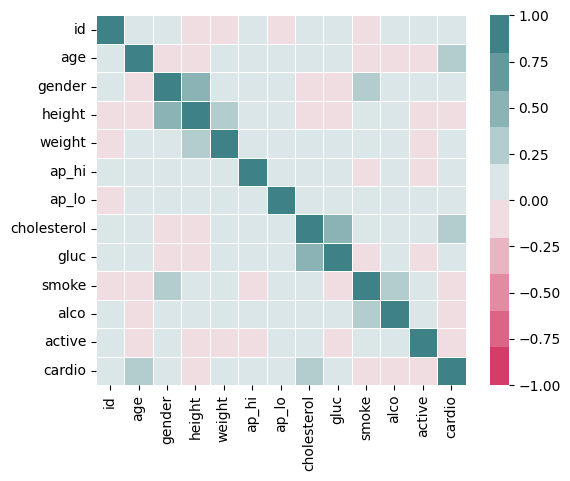

In [71]:
#import seaborn as sns
# seaborn: برای رسم Heatmap و نمودارهای آماری

#import matplotlib.pyplot as plt
# matplotlib: برای رسم نمودارها

#(heatmap)ترسیم هیت‌مپ
#sns.heatmap()
#تابعی است که از کتابخانه
#Seaborn 
#برای ترسیم هیت‌مپ استفاده می‌کند 
#برای ترسیم هیت‌مپ از ماتریس همبستگی(correlation matrix) استفاده می‌کند.
#هیت‌مپ یک نمودار است که با استفاده از رنگ‌ها، همبستگی میان متغیرها را نمایش می‌دهد.


# 1. axis_corr: این خط کد یک متغیر است که به نتیجه اجرای تابع 
# sns.heatmap() 
#اختصاص داده می‌شود
# این متغیر می‌تواند بعداً برای
# دسترسی به هیت‌مپ استفاده شود
axis_corr = sns.heatmap(
#df.corr() 
#محاسبه ماتریس همبستگی را انجام می‌دهد    
df.corr(),
#vmin=-1, vmax=1, center=0
# تنظیم می‌کند که محدوده رنگ‌ها از -1 همبستگی منفی کامل تا 
#+1همبستگی مثبت کامل
# باشد و رنگ سفید به مقدار 0عدم همبستگی نشان داده شود
vmin=-1, vmax=1, center=0,
# cmap=sns.diverging_palette(1, 200, n=10)
#تنظیم می‌کند که از پالت
#رنگی متمایز
#(diverging) استفاده شود
#3. 1, 200, n=10: این پارامترها مشخص می‌کنند که چگونه پالت رنگی ساخته شود:
# - 1: نقطه شروع طیف رنگی (در اینجا 1 معادل آبی است)
#   - 200: نقطه پایان طیف رنگی (در اینجا 200 معادل قرمز است)
# n=10: تعداد رنگ‌هایی که در پالت استفاده می‌شود (در اینجا 10 رنگ)

cmap=sns.diverging_palette(1, 200, n=10),
#square=True باعث می‌شود که سلول‌های ماتریس مربعی باشند
#linewidth=.5 عرض خطوط جداکننده سلول‌ها را مشخص می‌کند
square=True , linewidth=.5)

#این کد در پایتون با استفاده از کتابخانه Matplotlib به نمایش درآوردن یک نمودار است.
plt.show()


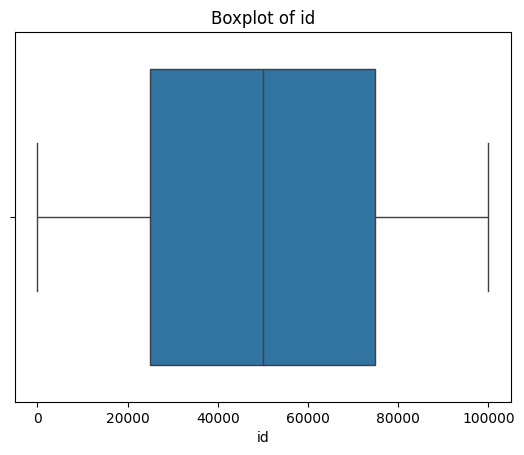

Outliers in id:
Series([], Name: id, dtype: int64)
---------------------


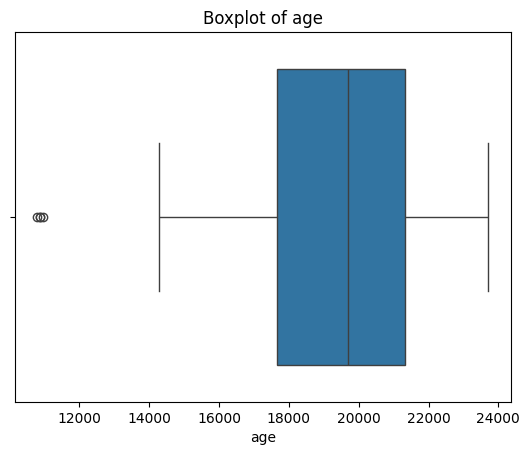

Outliers in age:
6219     10878.0
22343    10798.0
30666    10859.0
55905    10964.0
Name: age, dtype: float64
---------------------


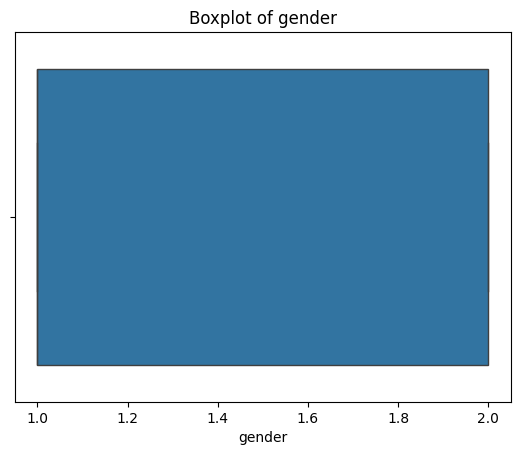

Outliers in gender:
Series([], Name: gender, dtype: int64)
---------------------


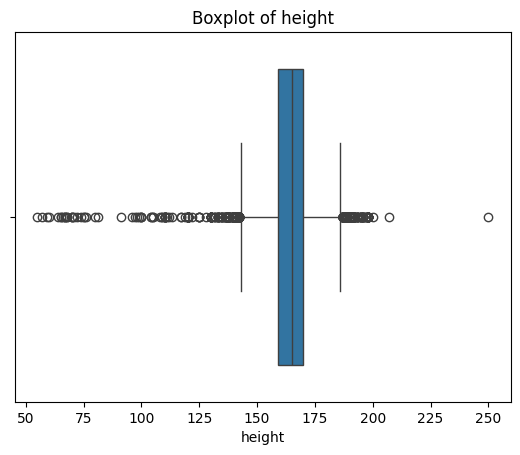

Outliers in height:
62       187
76       188
224       76
249      142
781      141
        ... 
69430    140
69475    187
69589    192
69784    141
69873    188
Name: height, Length: 519, dtype: int64
---------------------


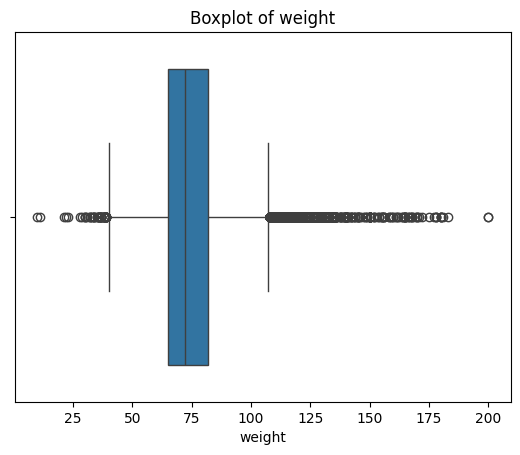

Outliers in weight:
15       112.0
62       115.0
83       110.0
196      108.0
267      115.0
         ...  
69873    108.0
69946    115.0
69947    113.0
69981    110.0
69996    126.0
Name: weight, Length: 1819, dtype: float64
---------------------


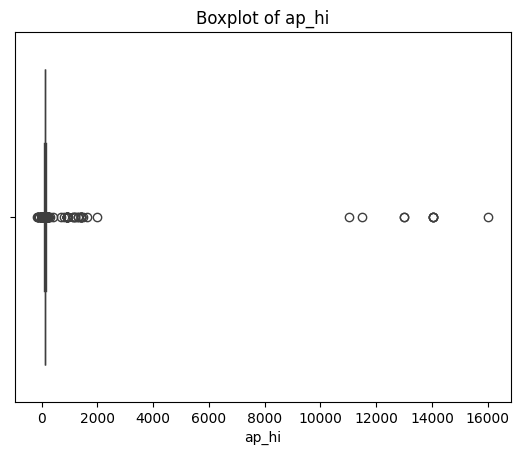

Outliers in ap_hi:
59       180.0
61       180.0
101      190.0
209       80.0
230      180.0
         ...  
69587    180.0
69593    180.0
69830    180.0
69894    200.0
69997    180.0
Name: ap_hi, Length: 1435, dtype: float64
---------------------


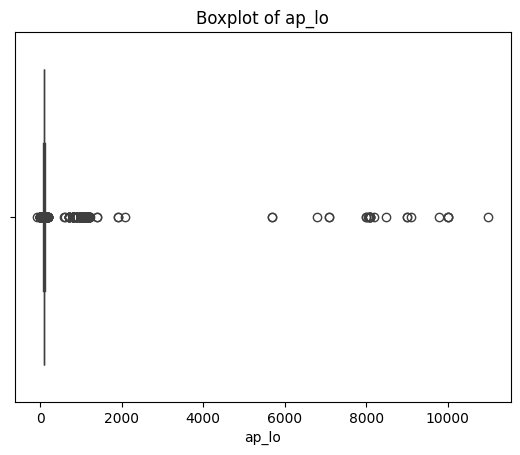

Outliers in ap_lo:
4          60
9          60
23         60
43         60
50         60
         ... 
69929     110
69932      60
69937      60
69967    1000
69978      60
Name: ap_lo, Length: 4632, dtype: int64
---------------------


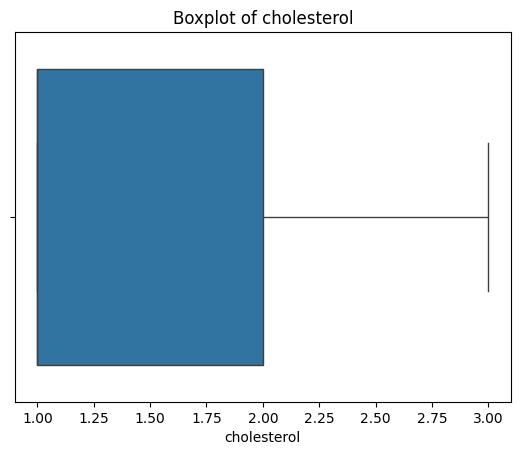

Outliers in cholesterol:
Series([], Name: cholesterol, dtype: int64)
---------------------


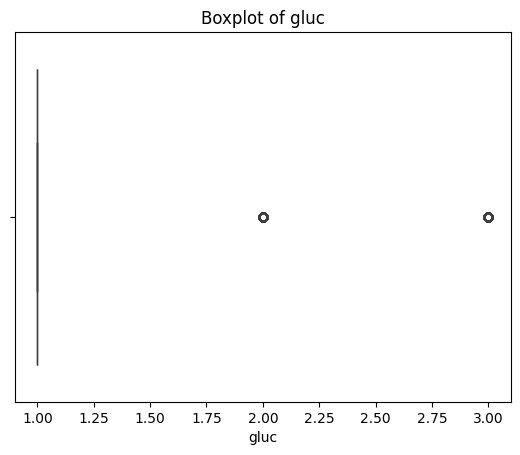

Outliers in gluc:
5        2
7        3
17       3
22       2
29       3
        ..
69981    2
69982    2
69991    2
69996    2
69998    2
Name: gluc, Length: 10521, dtype: int64
---------------------


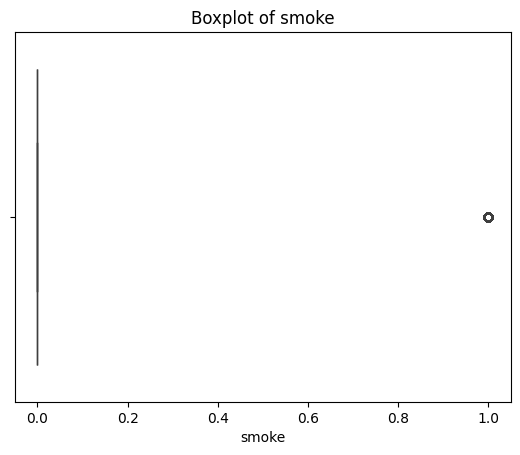

Outliers in smoke:
14       1
19       1
38       1
58       1
59       1
        ..
69950    1
69953    1
69957    1
69970    1
69995    1
Name: smoke, Length: 6169, dtype: int64
---------------------


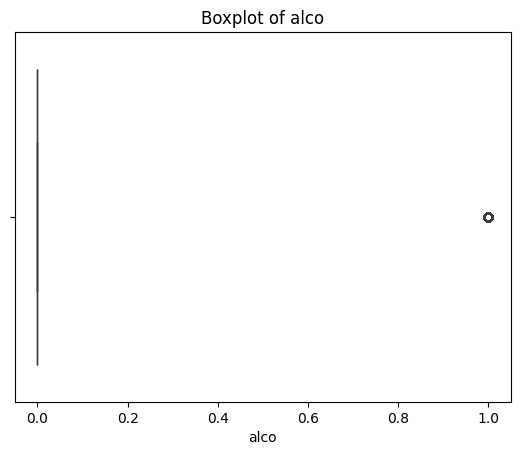

Outliers in alco:
14       1
62       1
99       1
101      1
107      1
        ..
69953    1
69970    1
69980    1
69985    1
69997    1
Name: alco, Length: 3764, dtype: int64
---------------------


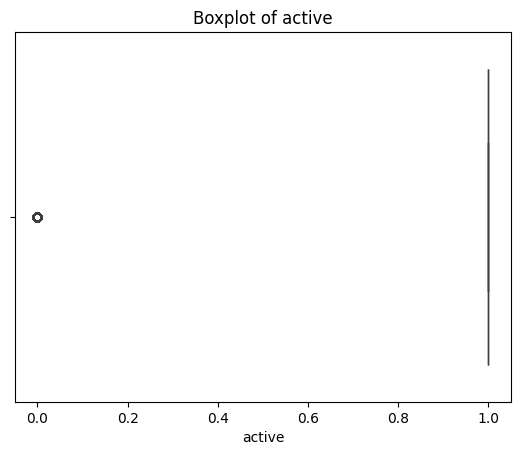

Outliers in active:
2        0
4        0
5        0
9        0
12       0
        ..
69970    0
69980    0
69985    0
69997    0
69998    0
Name: active, Length: 13739, dtype: int64
---------------------


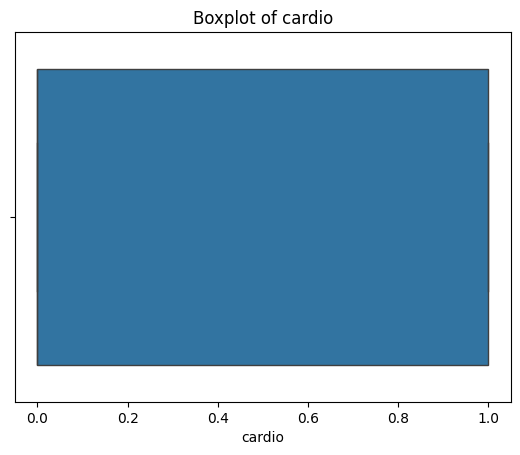

Outliers in cardio:
Series([], Name: cardio, dtype: int64)
---------------------


In [72]:
#import seaborn as sns
# seaborn: برای رسم boxplot و نمودارهای آماری

#import matplotlib.pyplot as plt
# matplotlib: برای رسم نمودارها

# این بخش از کد برای هر ستون موجود در DataFrame اقداماتی را انجام می‌دهد.
# `for column in df.columns:`: این خط شروع یک حلقه است که برای هر ستون در داده‌فریم `df` اجرا می‌شود.
for column in df.columns:
    # رسم نمودار Boxplot برای ستون فعلی
    # نمودار Boxplot یک نمودار آماری است که اطلاعاتی درباره توزیع و پراکندگی متغیر را نشان می‌دهد.
    # این بخش از کد از کتابخانه seaborn برای رسم نمودار Boxplot استفاده می‌کند.
    # x=column تنظیم می‌کند که متغیر فعلی را بر روی محور افقی یا همان محور ایکس نمودار نشان دهد.
    # data=df تنظیم می‌کند که داده‌های استفاده شده برای رسم نمودار از DataFrame df باشند.
    sns.boxplot(x=column, data=df)
    # `plt.title(f'Boxplot of {column}')`: این خط عنوان نمودار را به "Boxplot of [نام ستون]" تنظیم می‌کند.
    plt.title(f'Boxplot of {column}')
    # `plt.show()`: این خط نمودار جعبه‌ای را نمایش می‌دهد.
    plt.show()
    # پیدا کردن مقادیر Outlier
    # این بخش از کد مقادیر Outlier را برای ستون فعلی پیدا می‌کند.
    # برای این منظور، ابتدا چارک های اول و سوم محاسبه می‌شوند.
    # سپس با استفاده از این چارک ها و رنج بین آن‌ها (IQR)، محدوده‌ای تعیین می‌شود.
    # مقادیری که کوچکتر از حد پایین یا بزرگتر از حد بالا این محدوده قرار دارند، به عنوان مقادیر Outlier در نظر گرفته می‌شوند.    
    # `q1 = df[column].quantile(0.25)`: این خط محاسبه می‌کند که چهارک اول (Q1) داده‌های ستون فعلی چه مقداری است.
    q1 = df[column].quantile(0.25)
    # `q3 = df[column].quantile(0.75)`: این خط محاسبه می‌کند که چهارک سوم (Q3) داده‌های ستون فعلی چه مقداری است.
    q3 = df[column].quantile(0.75)
    # `iqr = q3 - q1`: این خط دامنه بین‌چهارکی (IQR) را محاسبه می‌کند که برابر است با تفاضل Q3 و Q1.
    iqr = q3 - q1
    #  `lower_bound = q1 - 1.5 * iqr`: این خط محاسبه می‌کند که حد پایین برای شناسایی نقاط پرت چه مقداری است، که برابر است با Q1 - 1.5 * IQR.
    lower_bound = q1 - 1.5 * iqr
    #  `upper_bound = q3 + 1.5 * iqr`: این خط محاسبه می‌کند که حد بالا برای شناسایی نقاط پرت چه مقداری است، که برابر است با Q3 + 1.5 * IQR.
    upper_bound = q3 + 1.5 * iqr
    # این خط شناسایی می‌کند که کدام مقادیر در ستون فعلی نقاط پرت هستند. نقاط پرت مقادیری هستند که از محدوده بین حد پایین و حد بالا خارج هستند.
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)][column]
    # این دو خط نام ستون فعلی و لیست نقاط پرت در آن ستون را چاپ می‌کنند.
    print(f'Outliers in {column}:')
    print(outliers)
    print('---------------------')

# Data Cleaning

In [78]:
#جمع مقادیر خالی یا  null هر فیچر
print(df.isna().sum())
print('--------------------------------')
#جمع مقادیر تکراری یا  duplicate هر فیچر
print(df.duplicated().sum())


id             0
age            0
gender         0
height         0
weight         0
ap_hi          0
ap_lo          0
cholesterol    0
gluc           0
smoke          0
alco           0
active         0
cardio         0
dtype: int64
--------------------------------
0


In [73]:
#برای فیچرهایی که تعداد outliers کم است میانگین را جایگزین مقادیر null می کنیم
#mean()

#برای فیچرهایی که تعداد outliers زیاد است برای کاهش تاثیر این مقادیر، مد را جایگزین مقادیر null می کنیم
#mode()

#جایگذاری مقادیر null ستون age با میانگین
df['age'].fillna(df['age'].mean(), inplace = True)

#جایگذاری مقادیر null ستون ap_hi با مد
df['ap_hi'].fillna(df['ap_hi'].mode()[0], inplace = True)

#چک کردن مجدد مقادیر null
print(df.isna().sum())

id             0
age            0
gender         0
height         0
weight         0
ap_hi          0
ap_lo          0
cholesterol    0
gluc           0
smoke          0
alco           0
active         0
cardio         0
dtype: int64


C:\Users\Sogand\AppData\Local\Temp\ipykernel_20168\1724168909.py:8: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['age'].fillna(df['age'].mean(), inplace = True)
C:\Users\Sogand\AppData\Local\Temp\ipykernel_20168\1724168909.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

Fo

In [74]:
#تبدیل روز به سال برای سن
#عملگر // تقسیم می کند و سپس قسمت صحیح عدد را بر می گرداند(عدد همچنان float است)
df['age'] = df['age']//365

#میتوان آن را به int تبدیل کرد 
#df['age']= df['age'].astype('int64')

#چک کردن سن 
print(df)

          id   age  gender  height  weight  ap_hi  ap_lo  cholesterol  gluc  \
0          0  50.0       2     168    62.0  110.0     80            1     1   
1          1  55.0       1     156    85.0  140.0     90            3     1   
2          2  51.0       1     165    64.0  130.0     70            3     1   
3          3  48.0       2     169    82.0  150.0    100            1     1   
4          4  47.0       1     156    56.0  100.0     60            1     1   
...      ...   ...     ...     ...     ...    ...    ...          ...   ...   
69995  99993  52.0       2     168    76.0  120.0     80            1     1   
69996  99995  61.0       1     158   126.0  140.0     90            2     2   
69997  99996  52.0       2     183   105.0  180.0     90            3     1   
69998  99998  61.0       1     163    72.0  135.0     80            1     2   
69999  99999  56.0       1     170    72.0  120.0     80            2     1   

       smoke  alco  active  cardio  
0          0  

# Data Normalization

In [75]:
# جدا کردن ویژگی‌ها و برچسب‌ها
#در واقع برای اینکه بتوان راحت تر نرمال سازی و بعد جدا کردن قسمت آزمون از آموزش را انجام داد ابتدا فیچرها را از لیبل جدا می کنیم
# ابتدا لیببل یا همان کاردیو به عنوان ستون تارگت حذف شده و نتیجه در فیچر ها ذخیره میشود
#در متن های مربوط به پردازش داده‌ها و آماده سازی آنها برای مدل‌های یادگیری ماشینی، استفاده از پارامتر `axis=1` معمولا به معنای انجام عملیات روی ستون‌ها (features) است.
#بنابراین، axis=1 به معنای عملیات روی ستون‌ها (features) و axis=0 به معنای عملیات روی ردیف‌ها (نمونه‌ها) است.
#default : axis=0
features = df.drop('cardio', axis=1)
# در اینجا ستون هدف در دیتا فریم در متغیر لیبل ذخیره میشود
labels = df['cardio']

In [76]:
# from sklearn.preprocessing import StandardScaler
# در این خط، یک شی `scaler` 
# از کلاس StandardScaler 
# ایجاد می‌شود.
# این شی برای استاندارد‌سازی ویژگی‌ها استفاده خواهد شد.

#from tabulate import tabulate
# Tabulate:  برای ایجاد جداول زیبا در خروجی

scaler = StandardScaler()

# در این خط، ویژگی‌ها (`features`)
# به روش استاندارد‌سازی توسط `scaler` 
#تبدیل می‌شوند. نتیجه در متغیر 
#`normal_df` ذخیره می‌شود.
normal_df = scaler.fit_transform(features)
# در این خط، مقادیر استاندارد‌شده ویژگی‌ها در متغیر `normal_df` چاپ می‌شوند.
print(normal_df)
print('----------------------------------------------------')
# در این خط، مقادیر استاندارد‌شده فیچرز در قالب یک جدول با استفاده از تابع `tabulate` چاپ می‌شوند.
# `tabulate` یک تابع در کتابخانه `tabulate` 
# است که به شما امکان می‌دهد داده‌ها را در قالب جدول چاپ کنید.
# پارامترهای `headers` 
# تعیین می‌کنند که هر ستون با چه عنوانی نمایش داده شود

print(tabulate( normal_df, headers= ['id', 'age', 'gender', 'height', 'weight', 'ap_hi', 'ap_lo' , 'cholesterol' , 'gluc' , 'smoke' , 'alco' , 'active' ]) )

[[-1.73208045 -0.41976607  1.36405487 ... -0.31087913 -0.23838436
   0.49416711]
 [-1.73204579  0.31915835 -0.73310834 ... -0.31087913 -0.23838436
   0.49416711]
 [-1.73201113 -0.27198119 -0.73310834 ... -0.31087913 -0.23838436
  -2.02360695]
 ...
 [ 1.7338537  -0.12419631  1.36405487 ... -0.31087913  4.19490608
  -2.02360695]
 [ 1.73392303  1.20586765 -0.73310834 ... -0.31087913 -0.23838436
  -2.02360695]
 [ 1.73395769  0.46694323 -0.73310834 ... -0.31087913 -0.23838436
   0.49416711]]
----------------------------------------------------
          id         age     gender       height        weight         ap_hi        ap_lo    cholesterol      gluc      smoke       alco     active
------------  ----------  ---------  -----------  ------------  ------------  -----------  -------------  --------  ---------  ---------  ---------
-1.73208      -0.419766    1.36405     0.443452   -0.847873      -0.122183    -0.0882385       -0.539322  -0.39572  -0.310879  -0.238384   0.494167
-1.73205   

# Splitting the data

In [77]:
#from sklearn.model_selection import train_test_split
# تقسیم داده‌ها به دو قسمت آموزش و آزمون

# در این خط، داده‌ها به دو قسمت آموزش و آزمون تقسیم می‌شوند:
# - `normal_df`: ویژگی‌های استاندارد‌شده
# - `labels`: برچسب‌های مربوط به ویژگی‌ها
# - `test_size=0.25`: 25% از داده‌ها به عنوان مجموعه آزمون انتخاب می‌شوند
# - `random_state=42`: برای تکرارپذیری نتایج، یک مقدار ثابت برای تولید اعداد تصادفی تنظیم می‌شود
# - به تابع می‌گوید که از کدام اعداد تصادفی برای تقسیم داده‌ها به مجموعه‌های آموزش و آزمون استفاده کند.
# - اگر رندوم استیت تعیین نشود
# - ممکن است داده‌ها را به صورت متفاوت به مجموعه‌های آموزش و آزمون تقسیم کند. این می‌تواند مشکلاتی در تکرارپذیری و مقایسه نتایج ایجاد کند.
# چهار متغیر برگردانده می‌شوند:
# - `train_features`: ویژگی‌های استاندارد‌شده در مجموعه آموزش
# - `test_features`: ویژگی‌های استاندارد‌شده در مجموعه آزمون
# - `train_labels`: برچسب‌های مربوط به مجموعه آموزش
# - `test_labels`: برچسب‌های مربوط به مجموعه آزمون

train_features, test_features, train_labels, test_labels = train_test_split(normal_df, labels, test_size=0.25, random_state=42)

# نمایش اندازه قسمت‌ها
print("number of train data:", len(train_features))
print("number of test data:", len(test_features))
# در این دو خط، تعداد نمونه‌های موجود در مجموعه آموزش و آزمون چاپ می‌شود

number of train data: 52500
number of test data: 17500


# Fitting

In [29]:
# . `RandomForestClassifier`: این یک الگوریتم یادگیری ماشین است که یک مدل درخت تصمیم جنگل تصادفی را ایجاد می‌کند. این الگوریتم برای طبقه‌بندی مناسب است.
# . `random_state=42`: این پارامتر سید تصادفی را تنظیم می‌کند تا نتایج هر بار اجرای کد یکسان باشد. این برای تکرارپذیری و قابلیت مقایسه نتایج مفید است.
# . `n_estimators=300`: این پارامتر تعداد درختان در جنگل تصادفی را تعیین می‌کند. بیشتر درختان معمولاً به بهبود عملکرد مدل کمک می‌کند.
# . `criterion="gini"`: این پارامتر معیار تصمیم‌گیری در درختان را تنظیم می‌کند. "gini" برای طبقه‌بندی بهتر از "entropy" است.
# . `max_depth=12`: این پارامتر حداکثر عمق درختان را محدود می‌کند تا از بیش‌برازش جلوگیری شود.
# . `min_samples_leaf=2`: این پارامتر حداقل تعداد نمونه‌ها در هر برگ درخت را تعیین می‌کند.
# . `min_samples_split=3`: این پارامتر حداقل تعداد نمونه‌ها برای تقسیم یک گره را مشخص می‌کند.
# . `bootstrap=True`: این پارامتر تعیین می‌کند که آیا باید نمونه‌گیری با جایگذاری انجام شود یا خیر.

rf = RandomForestClassifier(random_state=100, n_estimators=300, criterion="gini", max_depth=8, min_samples_leaf=2, min_samples_split=3, bootstrap=True)
# این خط کد مدل جنگل تصادفی را با استفاده از مجموعه داده‌های آموزش، آموزش می‌دهد. 
# `train_features` ویژگی‌های آموزشی 
# `train_labels` برچسب‌های آموزشی هستند
rf.fit(train_features, train_labels)
# در مجموع، این کد یک مدل جنگل تصادفی را با پارامترهای خاصی آموزش می‌دهد و آماده استفاده برای پیش‌بینی می‌کند.

#تست مقادیر مختلف برای پارامترهای مختلف
#1
#rf = RandomForestClassifier(random_state=42, n_estimators=200, criterion="gini", max_depth=8, min_samples_leaf=2, min_samples_split=4, bootstrap=True)
#test.accuracy = 0.7357142857142858
#train.accuracy = 0.7416190476190476

#2
#rf = RandomForestClassifier(random_state=42, n_estimators=400, criterion="gini", max_depth=8, min_samples_leaf=2, min_samples_split=3, bootstrap=True)
#test.accuracy = 0.7367428571428571
#train.accuracy = 0.7417523809523809

#3
#rf = RandomForestClassifier(random_state=100, n_estimators=400, criterion="gini", max_depth=8, min_samples_leaf=2, min_samples_split=4, bootstrap=True)
#test.accuracy = 0.7368571428571429
#train.accuracy = 0.7411619047619048

#4
#rf = RandomForestClassifier(random_state=100, n_estimators=300, criterion="gini", max_depth=12, min_samples_leaf=2, min_samples_split=4, bootstrap=True)
#test.accuracy = 0.7381714285714286
#train.accuracy = 0.7735047619047619

#5
#rf = RandomForestClassifier(random_state=42, n_estimators=300, criterion="gini", max_depth=12, min_samples_leaf=2, min_samples_split=3, bootstrap=True)
#test.accuracy = 0.7381714285714286
#train.accuracy = 0.7735047619047619

RandomForestClassifier(max_depth=8, min_samples_leaf=2, min_samples_split=3,
                       n_estimators=300, random_state=100)

# Evaluation

In [30]:
# . این تابع برای محاسبه دقت طبقه‌بندی استفاده می‌شود.
#from sklearn.metrics import accuracy_score
# این خط کد از مدل جنگل تصادفی آموزش دیده برای پیش‌بینی برچسب‌های نمونه‌های آموزشی استفاده می‌کند. 
# نتایج پیش‌بینی در متغیر `label_train` ذخیره می‌شوند.
# در اصل مدل رندوم فارست به داده های آموزشی اعمال شده و پیش بینی های آن در متغیر جدیدی ذخیره میشود
# پردیکت یک متد یادگیری ماشین است که از ورودی های جدید برچسب های پیش بینی شده را محاسبه میکند
label_train = rf.predict(train_features)

# این خط کد دقت طبقه‌بندی مدل جنگل تصادفی را روی مجموعه داده‌های آموزشی محاسبه می‌کند
# در این خط، تابع `accuracy_score` 
# برای محاسبه دقت مدل استفاده می‌شود. این تابع برچسب‌های واقعی 
# (`train_labels`)
# و برچسب‌های پیش‌بینی شده توسط مدل 
# (`label_train`) 
# را به عنوان ورودی دریافت می‌کند و دقت مدل را محاسبه می‌کند. 
# نتیجه این محاسبه در متغیر `acc_train_rf` ذخیره می‌شود.
acc_train_rf = accuracy_score(train_labels, label_train)
#این خط کد ساده‌تر است و فقط مقدار دقت آموزشی را چاپ می‌کند که در مرحله قبل محاسبه شده است.
acc_train_rf

0.7410095238095238

In [31]:
# همان اتفاقات بالا را برای داده تست انجام میدهد
label_test = rf.predict(test_features)
acc_test_rf = accuracy_score(test_labels, label_test)
acc_test_rf

0.7374857142857143